In [139]:
import pandas as pd
import numpy
import scipy.stats as sts
from scipy.optimize import curve_fit
import scipy.signal as sig
from scipy.ndimage import maximum_filter1d, percentile_filter
import scipy.ndimage as snd
import numpy as np
import matplotlib.pyplot as plt


In [140]:

%matplotlib widget
files = {7453: {'file': '/home/dprotter/testmount/Protter/cohort_2_pfc_screening/dwp/7453/2024_10_11/10_21_20/final_check/My_V4_Miniscope/7453_10_11_quick_traces.csv',
                    'titer': 5},
         7452: {'file': '/home/dprotter/testmount/Protter/cohort_2_pfc_screening/dwp/7452/2024_10_11/10_56_56/final_check/My_V4_Miniscope/7452_10_11_quick_traces.csv',
                    'titer': 5},
         7414: {'file': '/home/dprotter/testmount/Protter/cohort_2_pfc_screening/dwp/7414/2024_10_11/12_06_24/final_check/My_V4_Miniscope/7414_10_11_quick_traces.csv',
                    'titer': 4},
         7411: {'file': '/home/dprotter/testmount/Protter/cohort_2_pfc_screening/dwp/7411/2024_10_10/15_54_25/final_check/My_V4_Miniscope/quick_cell_traces.csv',
                    'titer': 4},
         7410: {'file': '/home/dprotter/testmount/Protter/cohort_2_pfc_screening/dwp/7410/2024_10_10/16_30_11/final_check/My_V4_Miniscope/7410_10_10_quick_traces.csv',
                    'titer': 4},
         7367: {'file': '/home/dprotter/testmount/Protter/cohort_2_pfc_screening/dwp/7367/2024_10_10/16_47_10/expID/My_V4_Miniscope/7367_10_10_quick_traces.csv',
                    'titer': 6},
         7367: {'file': '/home/dprotter/testmount/Protter/cohort_2_pfc_screening/dwp/7367/2024_10_10/16_47_10/expID/My_V4_Miniscope/7367_10_10_quick_traces.csv',
                    'titer': 6},
         }






In [141]:
def half_life(t , initial, t_one_half):  
    return initial * np.power(0.5, (t/t_one_half))

def plot_decay(params, peak_loc, axes_obj, window = 20, color = 'green', alpha = 0.8):
    initial_height, t_half = params
    xs = np.asarray([x for x in range(window)])
    ys = half_life(xs, initial_height, t_half)
    plt_xs = xs + peak_loc
    axes_obj.plot(plt_xs, ys, color = color, alpha = alpha)
    return axes_obj

class Cell:
    
    def __init__(self, animal_id, id, data):
        self._animal = animal_id
        self._id = id
        self.data = data
        self.statistics = {}
        
    def get_ID(self):
        return self._id
    
    def gaussian_smooth(self, kernel_size):
        self.smoothed = snd.gaussian_filter1d(self.data, kernel_size)
    
    def get_smoothed(self):
        if 'smoothed' in self.__dict__.keys():
            return self.smoothed
        else:
            print(f'no smoothed data to return for {self._animal}')
    

class CellContainer:
    '''should consider adding a cell ID dimension to all mathmatical processes, to easy lining them all up'''
    def __init__(self, animal_id, file):
        self.animal = animal_id
        self.file = file
        self._cell_list = {}
        

    def load(self, file = None):
        if not file:
            self._df = pd.read_csv(self.file)
        else:
            self._df = pd.read_csv(file)
        
        cells = [int(col.replace('y', '')) for col in self._df.columns if 'y' in col]
        self.cell_lookup_table = pd.DataFrame(data = cells, columns = ['cell_ID'])
        self.cell_lookup_table['cell_ID'].astype(int)
        for cell in cells:
            self._cell_list[int(cell)] = Cell(animal_id=self.animal, id = cell, data = self._df[f'y{cell}'].values)
            
         
    def get_cell_lookup_table(self):
        return self.cell_lookup_table
    
    def get_sorted_cells(self, sortby, direction = 'descending'):
        '''sortby must be string or list of strings'''
        if isinstance(sortby, list):
            '''have to sort repeatedly'''
        else:
            sorted_table = self.cell_lookup_table.sort_values(by = 'sortby')
        
        return [self._cell_list[cell] for cell in  sorted_table['cell_ID'].values]

    def create_cell_numpy_array(self, cell_list, statistic = 'data'):
        if not statistic == 'data':
            array = np.zeros((len(cell_list),2, len(cell_list[0].statistics[statistic])))
            for i, cell in enumerate(cell_list):
                array[i, 0, 0] = cell.animal_id
                array[i, 0, 1] = cell.id
                array[i, 1, :] = cell.statistics[statistic]
        else:
            array = np.zeros((len(cell_list), 2,  len(cell_list[0].data)))     
            for i, cell in enumerate(cell_list):
                    array[i, 0, 0] = cell.animal_id
                    array[i, 0, 1] = cell.id
                    array[i, 1, :] = cell.data
                    
        return array
              
    
    def get_cell_list(self):
        return [self._cell_list[cell] for cell in self.cell_lookup_table['cell_ID'].values]
    
    
    def _get_cell_list(self):
        '''not sure how to make sure all the different functions line up when making numpy arrays, 
        so im going to enforce some sorting here'''
        return sorted(self._cell_list)
    
    def generate_approximate_background(self, cell):
        
            #approximate noise by subtracting gaus smooth (ie signal) from the data
            #then add the extremely gaussian smooothed "baseline" of the data to return to appx baseline. works less well
            #for highly active cells. 
            un_norm = cell.data - cell.gaussian_smoothed 
            norm = un_norm + percentile_filter(cell.data, 2, 500) - np.percentile(un_norm, 2)
            return norm, un_norm
            
    def generate_min_peak_height_thereshold(self, cell):
            return maximum_filter1d(percentile_filter(cell.approximate_baseline, percentile = 95, size = 60), 60)
    
    
    def extract_decay_raw_data(self, decay_fit_window = 30, gaussian_smooothing_kernel = 1.5, iterations = 5):
         
        for cell_id in self._get_cell_list():
            cell = self._cell_list[cell_id]
            data = cell.data
            decay_fit_window = decay_fit_window
            
            gaus = snd.gaussian_filter1d(data, gaussian_smooothing_kernel)
            for i in range(iterations - 1):
                gaus = snd.gaussian_filter1d(gaus, gaussian_smooothing_kernel)

            cell.gaussian_smoothed = gaus
            

            cell.approximate_baseline, cell.approximate_noise =  self.generate_approximate_background(cell)
            cell.height_threshold = self.generate_min_peak_height_thereshold(cell)


            peaks = sig.find_peaks(cell.gaussian_smoothed, width= decay_fit_window/2, height=cell.height_threshold)

            
            
            decay_curves = np.zeros((len(peaks[0]), decay_fit_window))
            
            drop_list = []
            

            
            for j, peak in enumerate(peaks[0]):
                
                #decay window
                if peak+decay_fit_window > len(gaus):
                    drop_list += [j]
                else:
                    decay_curves[j,:] = gaus[peak:peak+decay_fit_window]
            
            peaks_out_dict = {}
            #remove any peaks/decay data that is too close to the end
            if len(drop_list)>0:
                print(f'drop_list {drop_list}')
                decay_curves = decay_curves[:min(drop_list),:]
                peaks_out = peaks[0][:min(drop_list)]

                for key in peaks[1].keys():
                    peaks_out_dict[key] = peaks[1][key][:min(drop_list)]
            else:
                peaks_out = peaks[0]
                peaks_out_dict = peaks[1]
                
            cell.fit_window = decay_fit_window
            cell.decay_curves = decay_curves  
            cell.peaks = peaks_out
            cell.peaks_statistics = peaks_out_dict
    
    
    
    def extract_decay_curves(self, decay_fit_window = 30, gaussian_smooothing_kernel = 1.5, iterations = 5):
         
        for cell_id in self._get_cell_list():
            cell = self._cell_list[cell_id]
            data = cell.data
            decay_fit_window = decay_fit_window
            
            gaus = snd.gaussian_filter1d(data, gaussian_smooothing_kernel)
            for i in range(iterations - 1):
                gaus = snd.gaussian_filter1d(gaus, gaussian_smooothing_kernel)

            cell.gaussian_smoothed = gaus
            

            cell.approximate_baseline, cell.approximate_noise =  self.generate_approximate_background(cell)
            cell.height_threshold = self.generate_min_peak_height_thereshold(cell)


            peaks = sig.find_peaks(cell.gaussian_smoothed, width= decay_fit_window/2, height=cell.height_threshold)

            
            decay_curves = np.zeros((len(peaks[0]), decay_fit_window))
            
            drop_list = []
            

            
            for j, peak in enumerate(peaks[0]):
                
                #decay window
                if peak+decay_fit_window > len(gaus):
                    drop_list += [j]
                else:
                    decay_curves[j,:] = gaus[peak:peak+decay_fit_window]
            
            peaks_out_dict = {}
            #remove any peaks/decay data that is too close to the end
            if len(drop_list)>0:
                print(f'drop_list {drop_list}')
                decay_curves = decay_curves[:min(drop_list),:]
                peaks_out = peaks[0][:min(drop_list)]

                for key in peaks[1].keys():
                    peaks_out_dict[key] = peaks[1][key][:min(drop_list)]
            else:
                peaks_out = peaks[0]
                peaks_out_dict = peaks[1]
                
            cell.fit_window = decay_fit_window
            cell.decay_curves = decay_curves  
            cell.peaks = peaks_out
            cell.peaks_statistics = peaks_out_dict
            
    
    
    def fit_decays(self):
        
        
        
        for cell_id in self._get_cell_list():
            cell = self._cell_list[cell_id]
            
            #cell peaks contains a list of peaks and a dict
            num_decay_curves = len(cell.decay_curves)
            
            params = np.zeros((num_decay_curves,2))
            params_cov = np.zeros((num_decay_curves,2,2))
            xdata = [x+1 for  x in range(cell.fit_window)]

            for i, decay in enumerate(cell.decay_curves):
                #initial guesses [initial height, t_half]
                p0  = [decay[0], 1]
                popt, pcov = curve_fit(half_life, xdata, decay[:cell.fit_window], p0 = p0)
                params[i,:] = popt
                params_cov[i,:,:] = pcov
                
            cell.fit_results = params
            cell.fit_cov = params_cov
            
    
    def generate_cell_fit_statistics(self, low_t_half_filter = 0, high_t_half_filter = 10*20):
        '''consider adding to lookup table for easy sorting'''
        cell_stats = []
        
        for cell_id in self._get_cell_list():
            cell = self._cell_list[cell_id]
            temp_params = cell.fit_results
            
            #top end filter
            temp_params = temp_params = temp_params[(temp_params[:,0]>low_t_half_filter) &(temp_params[:,1]<high_t_half_filter)]
            temp_params[:,1] = temp_params[:,1]/20
            
            if len(temp_params > 0):
            
                mean_initial, mean_t_half = np.mean(temp_params, axis = 0)
                median_initial, median_t_half = np.median(temp_params, axis = 0)
                max_initial, max_t_half = np.max(temp_params, axis = 0)
                
                med_baseline = sig.medfilt(cell.approximate_baseline, 99)

                snrs = (cell.gaussian_smoothed[cell.peaks] - med_baseline[cell.peaks]) / np.var(cell.data - cell.gaussian_smoothed)
                snr_75 = np.percentile(snrs, 75)
                max_snr = np.max(snrs)
                med_snr = np.median(snrs)
                mean_snr = np.mean(snrs)
                cell_stats += [[cell_id, mean_initial, mean_t_half, median_initial, median_t_half, max_initial, max_t_half, mean_snr, med_snr, max_snr, snr_75]]
            elif len(cell_stats) == 0 :
                pass
            else:
                cell_nans = [np.nan for i in range(max([len(row) for row in cell_stats])-1)]
                cell_stats += [[cell_id] + cell_nans]


        
        
        cell_stats = np.asarray(cell_stats)

        self.cell_statistics = pd.DataFrame(data = cell_stats, columns=['cell', 'mean_initial', 'mean_t_half', 'median_initial', 'median_t_half', 'max_initial', 'max_t_half',
                                                                        'mean_snr', 'median_snr', 'max_snr', 'snr_75'])
        
        return self.cell_statistics
    
    
    def plot_fits(self, num_cells = 0, extend_fit_factor = 2):
            

        cell_list = self._get_cell_list()
        
        '''let the user decide how many cells to plot. but if that number is greater
        than number of cells in this container, default to full set of cells'''
        if num_cells == 0 or num_cells > len(cell_list):
            num_cells = len(cell_list)
        else:
            cell_list = cell_list[:num_cells]
        

        fig, axs = plt.subplots(ncols=2, nrows = int(np.ceil(num_cells/2)), figsize = (10, num_cells/2*3))


        for cell_id, ax in zip(cell_list, axs.ravel()):
            cell = self._cell_list[cell_id]
            
            #cell peaks contains a list of peaks and a dict
            peak_locs = cell.peaks
            
            params = cell.fit_results

            data = cell.data
            ax.plot(data, alpha = 0.4)

            gaus = cell.gaussian_smoothed
            ax.plot(gaus, color = 'red')
            ax.scatter(x = peak_locs, y = gaus[peak_locs], color = 'darkgreen', marker = '.',zorder = 3)
            ax.hlines(y = np.median(gaus), xmin = 0, xmax = len(gaus), color = 'red')
            ax.plot(cell.height_threshold, color = 'black', zorder = 0, alpha = 0.3)
            
            med_baseline = sig.medfilt(cell.approximate_baseline, 99)
            
            appx_noise = np.var(cell.approximate_noise)
            snrs = (cell.gaussian_smoothed[cell.peaks] - med_baseline[cell.peaks]) / appx_noise
            if len(snrs) > 0:
                snr_75 = np.percentile(snrs, 75)
            else:
                snr_75 = 0
            
            ax.plot(med_baseline, color = 'black', zorder = 0, alpha = 0.6)
            ax.vlines(x = peak_locs, ymin = med_baseline[peak_locs], ymax = gaus[peak_locs])
            for param_pair, peak_loc in zip(params, peak_locs):
                window_extended = int(extend_fit_factor*cell.fit_window)
                if peak_loc + window_extended > len(gaus):
                    window_extended = len(gaus) - (peak_loc + window_extended) - 1
                ax = plot_decay(param_pair, peak_loc, ax, window = window_extended, color = 'green')
                ax = plot_decay(param_pair, peak_loc, ax, window = cell.fit_window, color = 'orange', alpha = 1)
            ax.set_title(f'{cell._id}: snr 75 {snr_75:.3f} : noise variance {np.var(cell.approximate_noise):.3f}')
        fig.suptitle(self.animal)
        fig.tight_layout()
        return fig


        
        

In [142]:

# animal = 7453
# ani_dict = files[animal]

# cont = CellContainer(animal, ani_dict['file'])
# cont.titer = ani_dict['titer']

# cont.load()
# cont.extract_decay_curves()

# cont.fit_decays()

# _ = cont.generate_cell_fit_statistics()

# fig = cont.plot_fits()

# # fig.savefig(f'/home/dprotter/Downloads/big_fig_{animal}_test.pdf')


In [143]:
# cell = cont._cell_list[2]
# med_noise = sig.medfilt(cell.approximate_noise, 99)

# un_norm = cell.data - cell.gaussian_smoothed 
# norm = un_norm + percentile_filter(cell.data, 2, 500) - np.percentile(un_norm, 2)

# fig, ax = plt.subplots()
# ax.plot(cell.data, color = 'blue', alpha = 0.5)
# ax.plot(cell.gaussian_smoothed, color = 'red')
# # ax.plot(un_norm, alpha = 0.5, color = 'orange')
# ax.plot(norm, alpha = 0.5, color = 'green')

In [144]:
# cell = cont._cell_list[47]
# cell_data = cell.approximate_noise
# detrend = sig.detrend(cell_data, type = 'linear')

# fig, ax = plt.subplots()
# ax.plot(cell_data, label = 'original')
# ax.plot(detrend, label = 'detrend')

# ax.legend()

In [145]:
animals = []
for animal, ani_dict in files.items():
    cont = CellContainer(animal, ani_dict['file'])
    cont.titer = ani_dict['titer']

    cont.load()
    cont.extract_decay_curves()
    
    cont.fit_decays()
    _ = cont.generate_cell_fit_statistics()
    plt.ioff()
    fig = cont.plot_fits()
    plt.ion()
    fig.savefig(f'/home/dprotter/Downloads/big_fig_{animal}.pdf')
    animals += [cont]

drop_list [14]
drop_list [1]
drop_list [1]
drop_list [43]
drop_list [66]
drop_list [9]


/home/dprotter/anaconda3/envs/computing/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:906: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


drop_list [11]


/home/dprotter/anaconda3/envs/computing/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:906: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


In [146]:
test_ani._cell_list[0].peaks

array([  764,  2527,  3216,  4007,  6650,  8718,  8798,  9551, 10244,
       11132, 11564, 12348, 13740, 13945])

In [147]:
peak_locs[slicer]

array([  174,  1049,  1994,  4914,  7356,  9163, 11200, 11737, 12729])

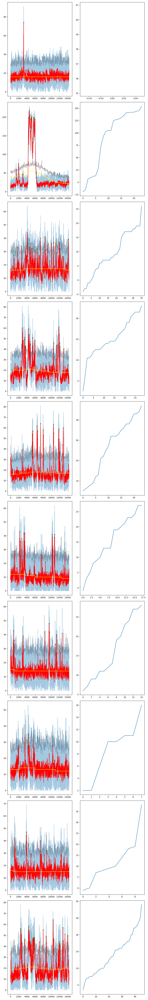

In [148]:
test_ani = animals[-1]
cells = test_ani._get_cell_list()
cells = cells[:10]

fig, axs = plt.subplots(ncols = 2, nrows =int( np.ceil(len(cells))),
                        figsize = (10, len(test_ani.get_cell_list())/2*3))

for i, cell_id  in enumerate(cells[:10]):
    cell = test_ani._cell_list[cell_id]
    peak_locs = cell.peaks
            
    

    data = cell.data
    axs[i,0].plot(data, alpha = 0.4)

    gaus = cell.gaussian_smoothed
    
    super_gaus = snd.gaussian_filter1d(gaus, 3000)
    
    noise_appx = data - gaus +  super_gaus 

    height_threshold =  maximum_filter1d(noise_appx, 50)
    
    axs[i,0].plot(height_threshold, color = 'black', zorder = 0, alpha = 0.3)
    
    slicer = gaus[peak_locs] < height_threshold[peak_locs]
    
    
    
    axs[i,0].plot(gaus, color = 'red')
    axs[i,0].plot(super_gaus, color = 'yellow')
    axs[i,0].scatter(x = peak_locs, y = gaus[peak_locs], color = 'darkgreen', marker = '.',zorder = 3)
    

    
    axs[i,0].scatter(x = peak_locs[slicer], y = gaus[peak_locs[slicer]], edgecolor = 'orange', facecolor = None, zorder = 3)
    
    axs[i,1].plot(sorted(gaus[peak_locs] - noise_appx[peak_locs]))
fig.tight_layout()
    

In [149]:
# quick_data = test_ani._cell_list[0].data
# fig, ax = plt.subplots(ncols = 2)
# ax[0].plot(quick_data, alpha = 0.4)
# ax[1].plot(quick_data, alpha = 0.4)

# iterations = 5
# kernel = 1.5
# gaus = snd.gaussian_filter1d(quick_data, kernel)

# cmap = plt.get_cmap('spring', iterations)


# ax[0].plot(gaus, color = cmap(0), alpha = 0.5)
# for i in range(iterations-1):
#     gaus = snd.gaussian_filter1d(gaus, kernel)
#     ax[0].plot(gaus, color = cmap(i+1), alpha = 0.5)

# gaus_one_step = snd.gaussian_filter1d(quick_data, 5)

# ax[1].plot(gaus, color = cmap(i+1), alpha = 0.6)
# ax[1].plot(gaus_one_step, color = 'green', alpha = 0.6)


/home/dprotter/anaconda3/envs/computing/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3440: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/dprotter/anaconda3/envs/computing/lib/python3.8/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/home/dprotter/anaconda3/envs/computing/lib/python3.8/site-packages/matplotlib/axes/_base.py:2503: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)


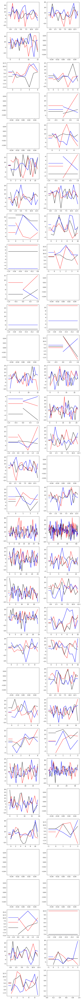

In [161]:
plt.ion()
test_ani = animals[0]


fig, axs = plt.subplots(ncols = 2, nrows =int( np.ceil(len(test_ani.get_cell_list())/2)),
                        figsize = (8, len(test_ani.get_cell_list())/2*3))
cells = test_ani._get_cell_list()

for cell_id, ax in zip(cells, axs.ravel()):
    cell = test_ani._cell_list[cell_id]
    gaus = cell.gaussian_smoothed
    data = cell.data
    peaks = cell.peaks
    plus_1 = data[peaks+1] - gaus[peaks]
    minus_1 = data[peaks-1] - gaus[peaks]
    ax.plot(minus_1, color = 'blue')
    ax.plot(plus_1, color = 'red')
    ax.plot(data[peaks] - gaus[peaks], color = 'black')
    ax.plot(minus_1, color = 'blue')
    ax.hlines(xmin=-1, xmax= 0, y=np.mean(minus_1), color = 'blue')
    ax.hlines(xmin=-1, xmax= 0, y=np.mean(data[peaks] - gaus[peaks]), color = 'black')
    ax.hlines(xmin=-1, xmax= 0, y=np.mean(plus_1), color = 'red')

fig.tight_layout()
    

In [199]:
test_ani = animals[0]


cells = test_ani._get_cell_list()
num_peaks = 0
for cell_id in cells:
    num_peaks += len(test_ani._cell_list[cell_id].peaks)

window = 6
out = np.zeros((num_peaks, 2, window*2+2))

loc = 0

for i, cell_id in enumerate(cells):
    cell = test_ani._cell_list[cell_id]
    gaus = cell.gaussian_smoothed
    data = cell.data
    peaks = cell.peaks
    
    means = []
    for peak in peaks:
        means += [np.mean(data[peak-3:peak+3])]
        
    means = np.asarray(means)
    gaus_vals = gaus[peaks]
    for j in range(window*2+1):
        diffs = (data[peaks-3+j] - gaus[peaks])
        diffs_norm = diffs / means
    
        k = 0
        for  diff, diff_n, gaus_val in zip(diffs, diffs_norm, gaus_vals):
    
            out[loc+k,0,0] = gaus_val
            out[loc+k,1,0] = gaus_val
            
            out[loc+k,0,j+1] = diff
            out[loc+k,1,j+1] = diff_n
            k+=1
    loc+=len(peaks)
    
    
    
        
    
    

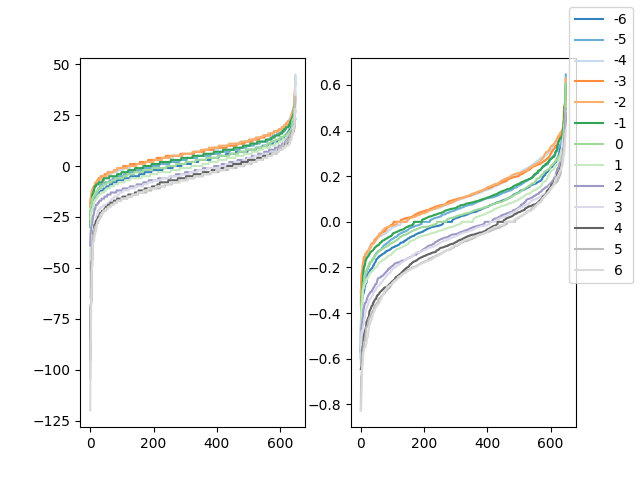

In [202]:
fig, axs = plt.subplots(ncols = 2)
cmap = plt.get_cmap('tab20c', window*2+1)

for i in range(window*2+1):
    
    axs[0].plot(sorted(out[:,0,i+1]), label = -window + i, color = cmap(i))
    axs[1].plot(sorted(out[:,1,i+1]), color = cmap(i))

fig.legend()

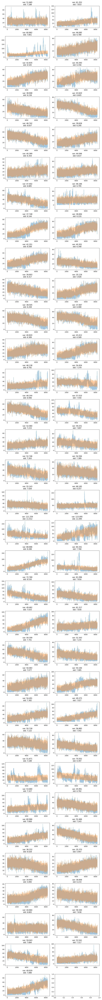

In [150]:
test_ani = animals[0]
plt.ioff()

fig, axs = plt.subplots(ncols = 2, nrows =int( np.ceil(len(test_ani.get_cell_list())/2)),
                        figsize = (10, len(test_ani.get_cell_list())/2*3))
cells = test_ani._get_cell_list()

for cell_id, ax in zip(cells, axs.ravel()):
    cell = test_ani._cell_list[cell_id]
    super_gaus = snd.gaussian_filter1d(cell.data, 2000)
    ax.plot(cell.data, alpha = 0.4)
    ax.plot(cell.data - cell.gaussian_smoothed + super_gaus, alpha = 0.4)
    ax.set_title(f'var: {np.var(cell.data - cell.gaussian_smoothed):.3f}\nstd: {np.std(cell.data - cell.gaussian_smoothed):.3f}')

fig.tight_layout()
fig.show()
plt.ion()


In [151]:

# window = 20
# def moving_average(x, w):
#     """calculate moving average with window size w"""
#     return np.convolve(x, np.ones(w), 'valid') / w
# fig, ax = plt.subplots()
# data = df['y0']
# ax.plot(data)
# ax.plot(moving_average(data, window), color  = 'orange')
# gaus = snd.gaussian_filter1d(data, 10)
# ax.plot(gaus, color = 'red')


In [153]:
# import scipy.signal as sig
# fig, axs = plt.subplots(ncols=2, nrows = 20, figsize = (10, 40))
# df = files[7414]['df']
# for i in range(20):
#     data = df[f'y{i}']
#     med = np.median(data)
#     axs[i, 0].plot(data, alpha = 0.4)
#     gaus = snd.gaussian_filter1d(data, 10)
#     med_gaus = np.median(gaus)
#     gaus_std = np.std(gaus)
#     peaks = sig.find_peaks(gaus,prominence=gaus_std/2)
#     axs[i, 0].plot(gaus, color = 'red')
#     axs[i,0].hlines(y = med, xmin = 0, xmax = len(data), color = 'black')
#     axs[i,0].hlines(y = med_gaus, xmin = 0, xmax = len(data), color = 'blue')
#     axs[i,0].scatter(x = peaks[0], y = gaus[peaks[0]], color = 'orange', marker = '.',zorder = 3)
    
#     mean_snr = np.mean(gaus[peaks[0]]/med_gaus)
    
#     axs[i,0].set_title(np.round(mean_snr,3))
    
#     bins = axs[i, 1].hist(gaus, bins = int(len(data)/50))
    
#     axs[i,1].vlines(x = med, ymin = 0, ymax = bins[1].max(), color = 'black')
# fig.tight_layout()

In [ ]:
test_ani.animal

In [7]:
# 
# fig, axs = plt.subplots(ncols=1, nrows = 40, figsize = (10, 70))

# cells = {}
# cell_peaks ={}
# decay_fit_window = 40
# for i in range(num_cells):
#     data = df[f'y{i}']
#     med = np.median(data)
#     axs[i].plot(data, alpha = 0.4)
#     gaus = snd.gaussian_filter1d(data, 5)
#     med_gaus = np.median(gaus)
#     gaus_std = np.std(gaus)
#     peaks = sig.find_peaks(gaus,prominence=gaus_std/1.5)
#     axs[i].plot(gaus, color = 'red')
#     axs[i].hlines(y = med, xmin = 0, xmax = len(data), color = 'black')
#     axs[i].hlines(y = med_gaus, xmin = 0, xmax = len(data), color = 'blue')
#     axs[i].scatter(x = peaks[0], y = gaus[peaks[0]], color = 'orange', marker = '.',zorder = 3)
    
#     peak_vals = gaus[peaks[0]]
#     peak_vals = sorted(peak_vals, reverse=True)
#     mean_snr = np.mean(np.mean(peak_vals[:15])/med_gaus)
    
#     axs[i].set_title(np.round(mean_snr,3))
#     max_peak = np.max(gaus[peaks[0]])
#     decay_curves = np.zeros((len(peaks[0]), 40))
    
#     drop_list = []
#     for j, peak in enumerate(peaks[0]):
        
#         #decay window
#         if peak+decay_fit_window > len(gaus):
#             drop_list += [j]
#         else:
#             decay_curves[j,:] = gaus[peak:peak+40]
        
    
#     peaks_out_dict = {}
#     #remove any peaks/decay data that is too close to the end (maybe this should be a variable?)   
#     if len(drop_list)>0:
#         decay_curves = decay_curves[:min(drop_list),:]
#         peaks_out = peaks[0][:min(drop_list)]

#         for key in peaks[1].keys():
#             peaks_out_dict[key] = peaks[1][key][:min(drop_list)]
#     else:
#         peaks_out_dict = peaks[1]
    
#     cells[i] = decay_curves  
#     cell_peaks[i] = (peaks_out, peaks_out_dict)
# fig.tight_layout()

In [ ]:
df.columns

In [ ]:
# create our dataset for fitting
cells_decay_curves = {}
cell_peaks ={}
decay_fit_window = 30
gaus_smooth_factor = 5

num_cells = len([col for col in df.columns if 'y' in col])
for i in range(num_cells):
    data = df[f'y{i}']
    med = np.median(data)
    gaus = snd.gaussian_filter1d(data, gaus_smooth_factor)
    med_gaus = np.median(gaus)
    gaus_std = np.std(gaus)
    
    #i tried using std, but variance seems to be better (IE std ^ 2)
    peaks = sig.find_peaks(gaus,prominence=np.var(data-gaus))

    decay_curves = np.zeros((len(peaks[0]), decay_fit_window))
    
    drop_list = []
    for j, peak in enumerate(peaks[0]):
        
        #decay window
        if peak+decay_fit_window > len(gaus):
            drop_list += [j]
        else:
            decay_curves[j,:] = gaus[peak:peak+decay_fit_window]
    
    peaks_out_dict = {}
    #remove any peaks/decay data that is too close to the end
    if len(drop_list)>0:
        print(f'drop_list {drop_list}')
        decay_curves = decay_curves[:min(drop_list),:]
        peaks_out = peaks[0][:min(drop_list)]

        for key in peaks[1].keys():
            peaks_out_dict[key] = peaks[1][key][:min(drop_list)]
    else:
        peaks_out = peaks[0]
        peaks_out_dict = peaks[1]
    
    cells_decay_curves[i] = decay_curves  
    cell_peaks[i] = (peaks_out, peaks_out_dict)
    
    




In [13]:
# cell_list = [cell for cell in sorted(cells_decay_curves.keys())]
# cell_list = cell_list[:30]

# fig, axs = plt.subplots(ncols=2, nrows = int(np.ceil(len(cell_list)/2)), figsize = (10, len(cell_list)/2*3))
# fit_window = 30
# cell_params = {}






# for cell, ax in zip(cell_list, axs.ravel()[:30]):

#     #cell peaks contains a list of peaks and a dict
#     peak_locs = cell_peaks[cell][0]
    
#     params = np.zeros((len(cells_decay_curves[cell]),2))
#     xdata = [x+1 for  x in range(fit_window)]

#     for i, decay in enumerate(cells_decay_curves[cell]):
#         #initial guesses [initial height, t_half]
#         p0  = [decay[0], 1]
#         popt, pcov = curve_fit(half_life, xdata, cells_decay_curves[cell][i][:fit_window], p0 = p0)
#         params[i,:] = popt
#     cell_params[cell] = params
#     # residuals = np.zeros((len(cells[cell]), len(cells[cell][0])))


#     data = df[f'y{cell}']
#     med = np.median(data)
#     ax.plot(data, alpha = 0.4)
#     gaus = snd.gaussian_filter1d(data, gaus_smooth_factor)
    
#     ax.plot(gaus, color = 'red')
#     ax.scatter(x = peak_locs, y = gaus[peak_locs], color = 'darkgreen', marker = '.',zorder = 3)
#     ax.hlines(y = np.median(gaus), xmin = 0, xmax = len(gaus), color = 'red')
#     ax.hlines(y = np.median(data), xmin = 0, xmax = len(gaus), color = 'blue')

#     for param_pair, peak_loc in zip(params, peak_locs):
#         ax = plot_decay(param_pair, peak_loc, ax, window = 60)
#         ax = plot_decay(param_pair, peak_loc, ax, window = fit_window, color = 'orange', alpha = 1)
#         ax.set_title(f'{cell}: {np.round(np.std(data-gaus), 3)}')


In [15]:
data = df[f'y{cell}']

def zscore_modified(data, median = None, MAD = None):
    """
    Helper function to calculate z-scores

    Parameters
    ----------
    data : list
        time series data for one event
    median : int/float, optional
        baseline mean value
    MAD : int/float, optional
        baseline median_absolute_difference

    Returns
    ----------
    zscored_data : list
        zscore values of time series for an event
    """
    # Default Params, no arguments passed
    if not median:
        median = np.median(data)
    if not MAD:
        MAD = median_absolute_difference(data)
    # Calculates zscore per event in list
    zscored_data = [0.6745*(i - median) / MAD for i in data]
    return {'mzscored':zscored_data, 'MAD':MAD, 'median':median}

def median_absolute_difference(data):
    return np.median(np.absolute(data - np.median(data.ravel())))


z_scored = zscore_modified(data)

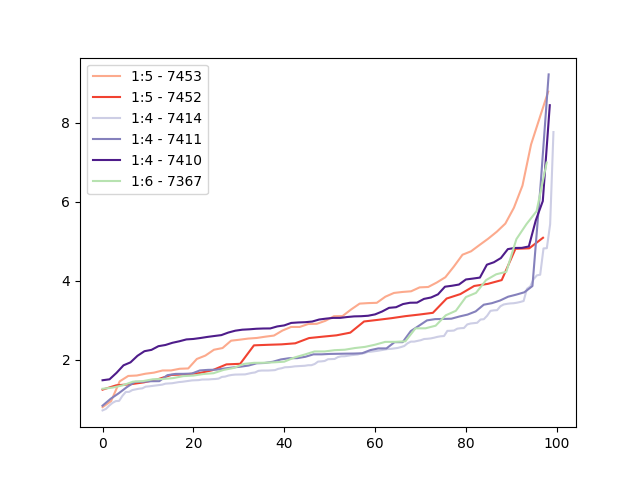

In [155]:
colors = {4:{'color':plt.get_cmap('Purples', 100), 'iteration':1}, 
          5:{'color':plt.get_cmap('Reds', 100), 'iteration':1}, 
          6:{'color':plt.get_cmap('Greens', 100), 'iteration':1}}

plt.figure()

for animal in animals:
    titer = animal.titer
    cell_stats = animal.cell_statistics.sort_values(by= 'median_t_half')
    cell_stats = cell_stats.dropna()
    xs = [100*i/len(cell_stats) for i in range(len(cell_stats))]
    
    
    iteration = colors[titer]['iteration']
    color = colors[titer]['color'](iteration*30)
    colors[titer]['iteration']+=1
    plt.plot(xs, cell_stats['median_t_half'].values, color = color, label = f'1:{titer} - {animal.animal}')
    plt.legend()
    

In [ ]:
cell_stats.head()

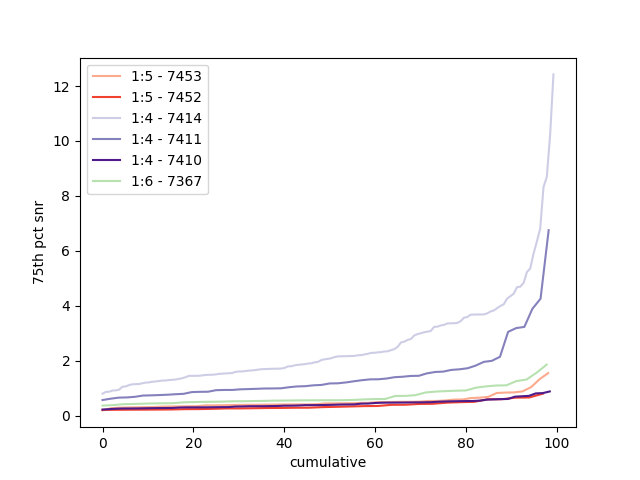

In [203]:
colors = {4:{'color':plt.get_cmap('Purples', 100), 'iteration':1}, 
          5:{'color':plt.get_cmap('Reds', 100), 'iteration':1}, 
          6:{'color':plt.get_cmap('Greens', 100), 'iteration':1}}

plt.figure()

for animal in animals:
    titer = animal.titer
    cell_stats = animal.cell_statistics.sort_values(by= 'snr_75')
    cell_stats = cell_stats.dropna()
    xs = [100*i/len(cell_stats) for i in range(len(cell_stats))]
    
    
    iteration = colors[titer]['iteration']
    color = colors[titer]['color'](iteration*30)
    colors[titer]['iteration']+=1
    plt.plot(xs, cell_stats['snr_75'], color = color, label = f'1:{titer} - {animal.animal}')
plt.ylabel('75th pct snr')
plt.xlabel('cumulative')
plt.legend()

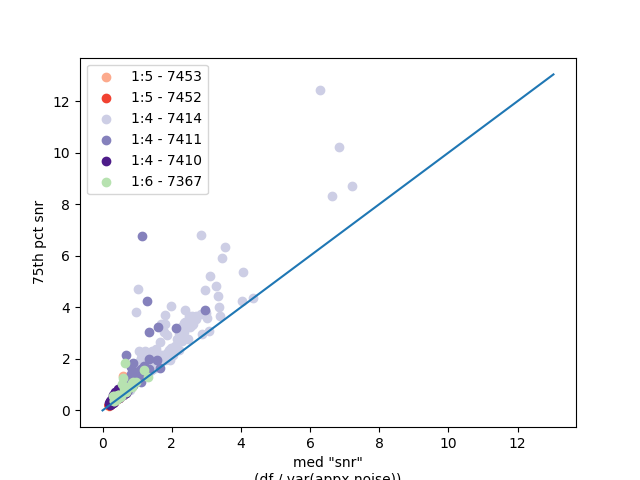

In [204]:
colors = {4:{'color':plt.get_cmap('Purples', 100), 'iteration':1}, 
          5:{'color':plt.get_cmap('Reds', 100), 'iteration':1}, 
          6:{'color':plt.get_cmap('Greens', 100), 'iteration':1}}

plt.figure()

for animal in animals:
    titer = animal.titer
    cell_stats = animal.cell_statistics.sort_values(by= 'median_snr')
    cell_stats = cell_stats.dropna()
    
    iteration = colors[titer]['iteration']
    color = colors[titer]['color'](iteration*30)
    colors[titer]['iteration']+=1
    plt.scatter( cell_stats['median_snr'], cell_stats['snr_75'], color = color, label = f'1:{titer} - {animal.animal}')
plt.plot([0, max(plt.ylim()[1], plt.xlim()[1])],[0, max(plt.ylim()[1], plt.xlim()[1])])
plt.ylabel('75th pct snr')
plt.xlabel('med "snr"\n(df / var(appx noise))')
plt.legend()

In [42]:
cell_stats

,cell,mean_initial,mean_t_half,median_initial,median_t_half,max_initial,max_t_half,mean_snr,median_snr,max_snr,snr_75
0,0.0,78.532935,1.356409,78.532935,1.356409,78.532935,1.356409,1.311620,1.311620,1.311620,1.311620
1,1.0,119.716714,6.454974,133.268544,5.760154,203.728780,9.760621,1.205286,1.198040,3.284949,1.560351
2,2.0,32.138125,2.540579,31.860023,1.937794,43.470133,7.993803,0.461609,0.412502,0.766075,0.530360
3,3.0,45.382762,2.695629,46.559253,2.298733,59.726596,6.385478,0.652403,0.666882,1.037371,0.716280
4,4.0,48.908143,2.997878,53.091687,2.256276,64.271442,8.130233,0.840587,0.873047,1.316286,1.101382
5,5.0,34.983617,2.479662,35.971004,1.662489,42.771533,6.124142,0.686263,0.721328,0.961770,0.841549
6,6.0,36.855741,1.929456,37.310932,1.509889,46.689532,5.981836,0.616409,0.658394,0.944652,0.744271
7,7.0,29.890076,5.130283,30.640066,4.017439,32.917224,8.499104,0.423268,0.406337,0.541783,0.446971
8,8.0,35.102729,3.033955,32.420583,2.455496,45.099140,5.412616,0.437379,0.408662,0.640606,0.557769
9,9.0,44.692029,2.202199,44.281264,1.642208,65.529052,8.058106,0.503577,0.460778,0.942500,0.602153


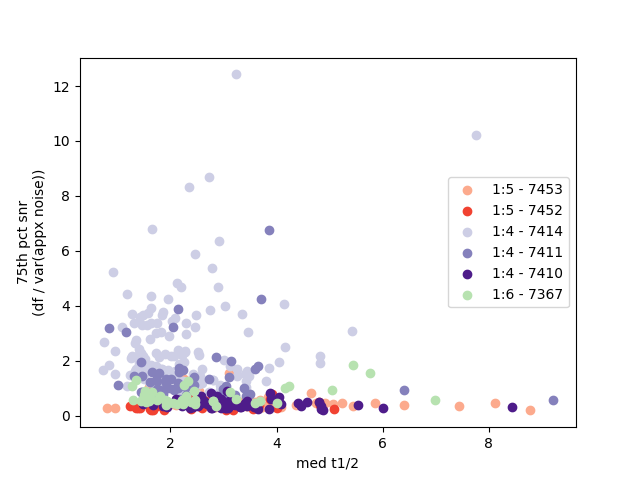

In [44]:
colors = {4:{'color':plt.get_cmap('Purples', 100), 'iteration':1}, 
          5:{'color':plt.get_cmap('Reds', 100), 'iteration':1}, 
          6:{'color':plt.get_cmap('Greens', 100), 'iteration':1}}

plt.figure()

for animal in animals:
    titer = animal.titer
    cell_stats = animal.cell_statistics
    cell_stats = cell_stats.dropna()
    
    
    iteration = colors[titer]['iteration']
    color = colors[titer]['color'](iteration*30)
    colors[titer]['iteration']+=1
    plt.scatter( cell_stats['median_t_half'], cell_stats['snr_75'], color = color, label = f'1:{titer} - {animal.animal}')


plt.ylabel('75th pct snr\n(df / var(appx noise))')
plt.xlabel('med t1/2')
plt.legend()

In [ ]:
fig = plt.figure()

plt.scatter(cell_stats[:,3],cell_stats[:,4], label = 'median init')
plt.legend()

In [ ]:
# fig, axs = plt.subplots(ncols=2, nrows = 20, figsize = (10, 40))

# cells = {}

# for i in range(0):
#     data = df[f'y{i}']
#     med = np.median(data)
#     axs[i, 0].plot(data, alpha = 0.4)
#     gaus = snd.gaussian_filter1d(data, 5)
#     med_gaus = np.median(gaus)
#     gaus_std = np.std(gaus)
#     peaks = sig.find_peaks(gaus,prominence=gaus_std/2)
#     axs[i, 0].plot(gaus, color = 'red')
#     axs[i,0].hlines(y = med, xmin = 0, xmax = len(data), color = 'black')
#     axs[i,0].hlines(y = med_gaus, xmin = 0, xmax = len(data), color = 'blue')
#     axs[i,0].scatter(x = peaks[0], y = gaus[peaks[0]], color = 'orange', marker = '.',zorder = 3)
    
#     mean_snr = np.mean(gaus[peaks[0]]/med_gaus)
    
#     axs[i,0].set_title(np.round(mean_snr,3))
#     max_peak = np.max(gaus[peaks[0]])
#     decay_curves = np.zeros((len(peaks[0]), 40))
#     for j, peak in enumerate(peaks[0]):
#         decay_curves[j,:] = gaus[peak:peak+40]
#         axs[i,1].plot(gaus[peak:peak+20])
#     cells[i] = decay_curves  
# fig.tight_layout()